In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [54]:
core_path = os.getcwd().replace("notebooks","artifacts")
values_path = os.path.join(core_path, "values.csv")
df = pd.read_csv(values_path)

In [55]:
df.head()

,VH,VH_Times_VH,VH_VV_Ratio,VV,VV_Plus_VH,VV_Times_VH,VV_Times_VV,VV_VH_Ratio,B11,B12,...,B8,B8A,DI,EVI,MNDWI,NDBI,NDTI,NDVI,State,wClass
0,-20.471160,419.068380,0.534892,-10.949850,-31.421009,224.156122,119.899209,1.869538,2312,1921,...,1900,1959,0.135157,0.160226,-0.284444,0.097816,-0.197258,0.077098,KA,nonWater
1,-12.451718,157.279416,0.584572,-7.184558,-19.636276,89.623977,52.108571,1.748148,2709,1798,...,2224,2543,0.329650,1.298890,-0.594467,0.098317,-0.445919,0.472848,KA,nonWater
2,-21.045413,443.430633,0.538398,-11.317876,-32.363289,238.197993,128.094463,1.859419,4444,3536,...,2854,3106,0.215928,0.221991,-0.583185,0.217868,-0.502762,0.165850,KA,nonWater
3,-15.790104,250.885827,0.554146,-8.694810,-24.484914,137.247900,76.302481,1.833438,3186,2284,...,1942,2160,0.259951,0.847958,-0.628002,0.242590,-0.516600,0.362807,KA,nonWater
4,-17.177968,296.727165,0.599235,-10.238045,-27.416013,175.894071,106.111523,1.698753,3142,2250,...,2762,2650,0.294595,0.639208,-0.529326,0.064363,-0.398819,0.350611,KA,nonWater


In [56]:
df.columns

Index(['VH', 'VH_Times_VH', 'VH_VV_Ratio', 'VV', 'VV_Plus_VH', 'VV_Times_VH',
       'VV_Times_VV', 'VV_VH_Ratio', 'B11', 'B12', 'B2', 'B3', 'B4', 'B5',
       'B6', 'B7', 'B8', 'B8A', 'DI', 'EVI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI',
       'State', 'wClass'],
      dtype='object')

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 761 entries, 0 to 760
Data columns (total 26 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   VH           761 non-null    float64
 1   VH_Times_VH  761 non-null    float64
 2   VH_VV_Ratio  761 non-null    float64
 3   VV           761 non-null    float64
 4   VV_Plus_VH   761 non-null    float64
 5   VV_Times_VH  761 non-null    float64
 6   VV_Times_VV  761 non-null    float64
 7   VV_VH_Ratio  761 non-null    float64
 8   B11          761 non-null    int64  
 9   B12          761 non-null    int64  
 10  B2           761 non-null    int64  
 11  B3           761 non-null    int64  
 12  B4           761 non-null    int64  
 13  B5           761 non-null    int64  
 14  B6           761 non-null    int64  
 15  B7           761 non-null    int64  
 16  B8           761 non-null    int64  
 17  B8A          761 non-null    int64  
 18  DI           761 non-null    float64
 19  EVI     

In [58]:
df.isnull().sum()

VH             0
VH_Times_VH    0
VH_VV_Ratio    0
VV             0
VV_Plus_VH     0
VV_Times_VH    0
VV_Times_VV    0
VV_VH_Ratio    0
B11            0
B12            0
B2             0
B3             0
B4             0
B5             0
B6             0
B7             0
B8             0
B8A            0
DI             0
EVI            0
MNDWI          0
NDBI           0
NDTI           0
NDVI           0
State          0
wClass         0
dtype: int64

In [59]:
df.duplicated().sum()

0

In [60]:
numerical_columns=df.columns[df.dtypes!='object']
categorical_columns=df.columns[df.dtypes=='object']
print("Numerical columns:",numerical_columns)
print('Categorical Columns:',categorical_columns)

Numerical columns: Index(['VH', 'VH_Times_VH', 'VH_VV_Ratio', 'VV', 'VV_Plus_VH', 'VV_Times_VH',
       'VV_Times_VV', 'VV_VH_Ratio', 'B11', 'B12', 'B2', 'B3', 'B4', 'B5',
       'B6', 'B7', 'B8', 'B8A', 'DI', 'EVI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI'],
      dtype='object')
Categorical Columns: Index(['State', 'wClass'], dtype='object')


In [61]:
df[numerical_columns].describe()

,VH,VH_Times_VH,VH_VV_Ratio,VV,VV_Plus_VH,VV_Times_VH,VV_Times_VV,VV_VH_Ratio,B11,B12,...,B6,B7,B8,B8A,DI,EVI,MNDWI,NDBI,NDTI,NDVI
count,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,...,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000,761.000000
mean,-23.578197,642.419867,0.589859,-13.812254,-37.390451,366.380478,226.695810,1.809192,1878.902760,1497.638633,...,1392.337714,1522.452037,1542.044678,1619.676741,0.045304,3.686114,-0.092544,-0.002347,-0.001837,0.079711
std,8.274065,430.386321,0.126223,5.621344,13.411096,239.046035,166.915585,1.146713,1481.394363,1248.176916,...,890.234239,990.826288,1050.120455,1116.107322,0.267813,65.015614,0.500665,0.235421,0.478666,0.312001
min,-42.673959,39.598483,-0.499622,-28.603905,-62.517757,-17.190238,1.922254,-9.806896,46.000000,37.000000,...,41.000000,64.000000,108.000000,79.000000,-0.629630,-43.194444,-0.678013,-0.700865,-0.651519,-0.614907
25%,-30.693217,254.386439,0.522937,-18.495727,-50.443198,140.146015,82.216438,1.553356,265.000000,225.000000,...,358.000000,360.000000,333.000000,328.000000,-0.125534,0.191474,-0.505768,-0.150943,-0.401660,-0.141935
50%,-22.809953,522.489457,0.591174,-13.316968,-36.340371,306.314046,178.235266,1.742585,2052.000000,1398.000000,...,1583.000000,1752.000000,1808.000000,1918.000000,0.124356,0.358148,-0.378963,0.058474,-0.259154,0.122837
75%,-15.914760,963.500815,0.656546,-9.011337,-24.783110,597.488011,346.015588,1.950237,3130.000000,2523.000000,...,2054.000000,2286.000000,2332.000000,2470.000000,0.236679,0.846597,0.388235,0.170102,0.474313,0.280000
max,-6.143101,1862.696311,0.972978,2.840043,-3.303058,908.184538,939.277934,21.068938,5341.000000,4736.000000,...,3907.000000,4496.000000,4640.000000,4810.000000,0.626594,1520.000000,0.877333,0.513480,0.897079,0.856651


In [62]:
df[categorical_columns].describe()

,State,wClass
count,761,761
unique,2,2
top,TN,water
freq,400,389


In [63]:
df['State'].value_counts()

State
TN    400
KA    361
Name: count, dtype: int64

In [64]:
df['wClass'].value_counts()

wClass
water       389
nonWater    372
Name: count, dtype: int64

## histogram

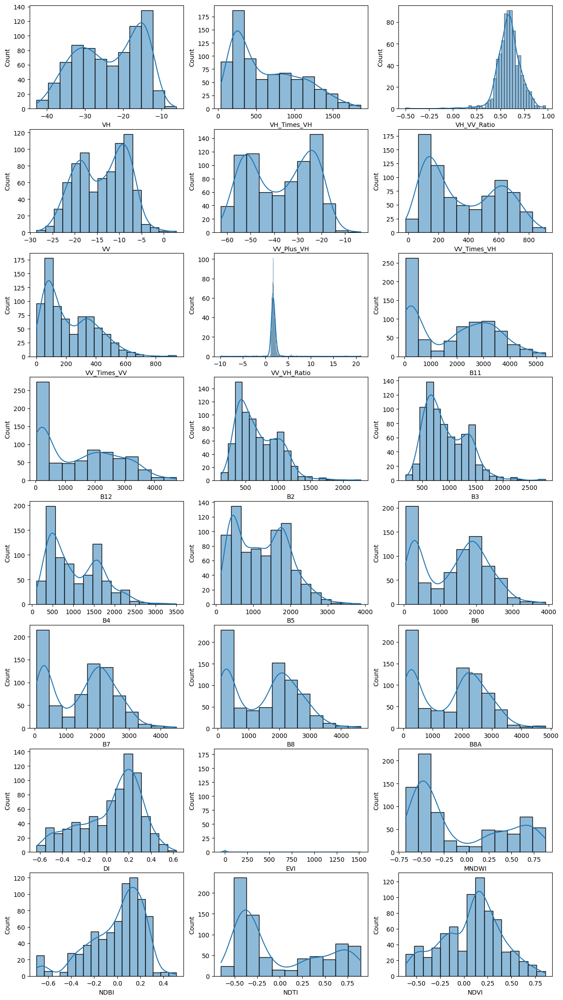

In [65]:
fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(15, 28))
axes = axes.flatten()
for i, variable in enumerate(numerical_columns):
    sns.histplot(data=df,x=variable,ax=axes[i],kde=True)
plt.show()

## pairplot

c:\Users\atree\Documents\GitHub\swSentinel\venv\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


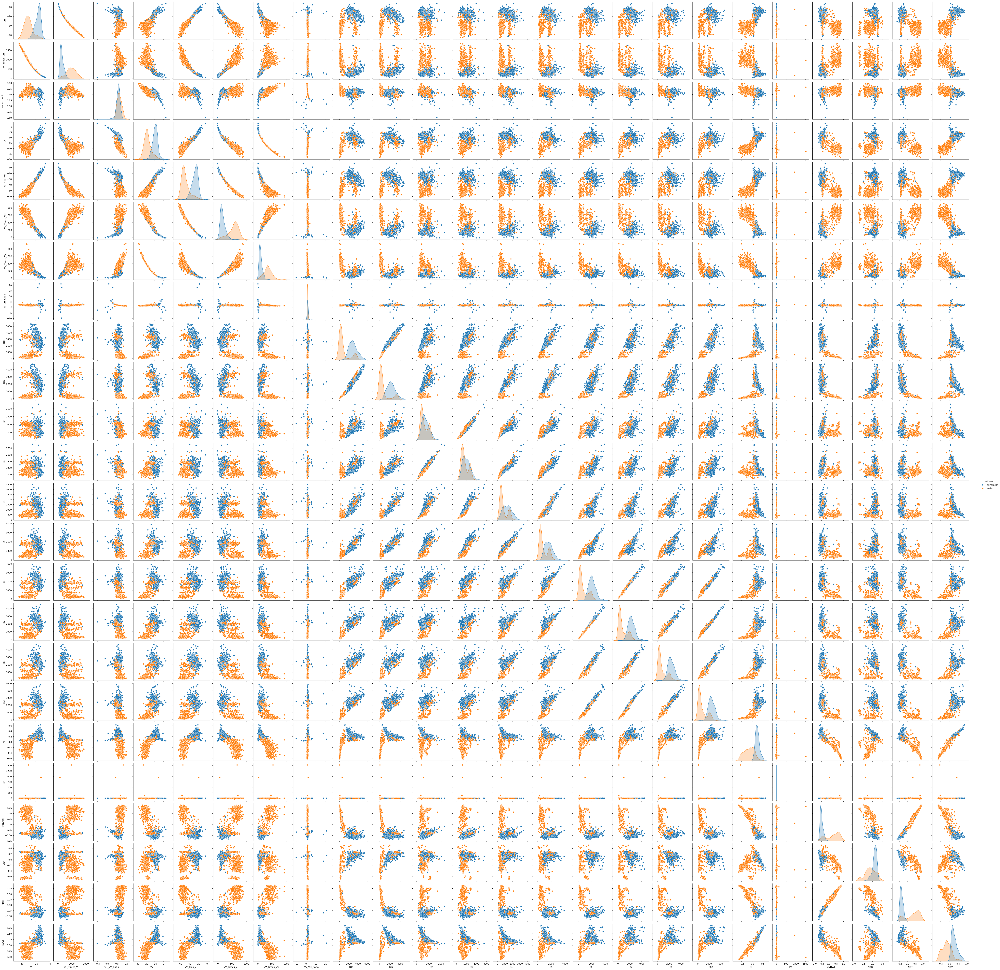

In [66]:
sns.pairplot(df, hue ='wClass')

## correlation heatmap

<Axes: >

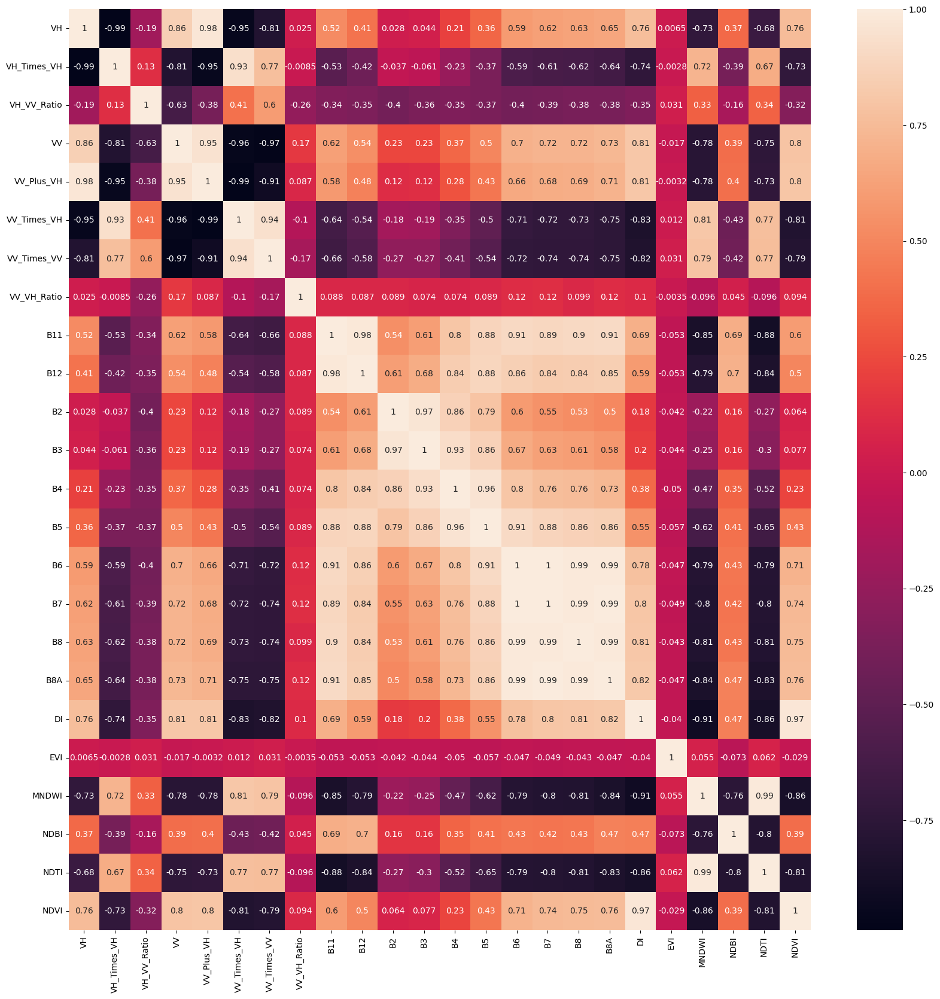

In [78]:
plt.figure(figsize=(20,20))
sns.heatmap(df.drop(['State', 'wClass'], axis=1).corr(),annot=True)

## distribution of water and nonWater values for different bands

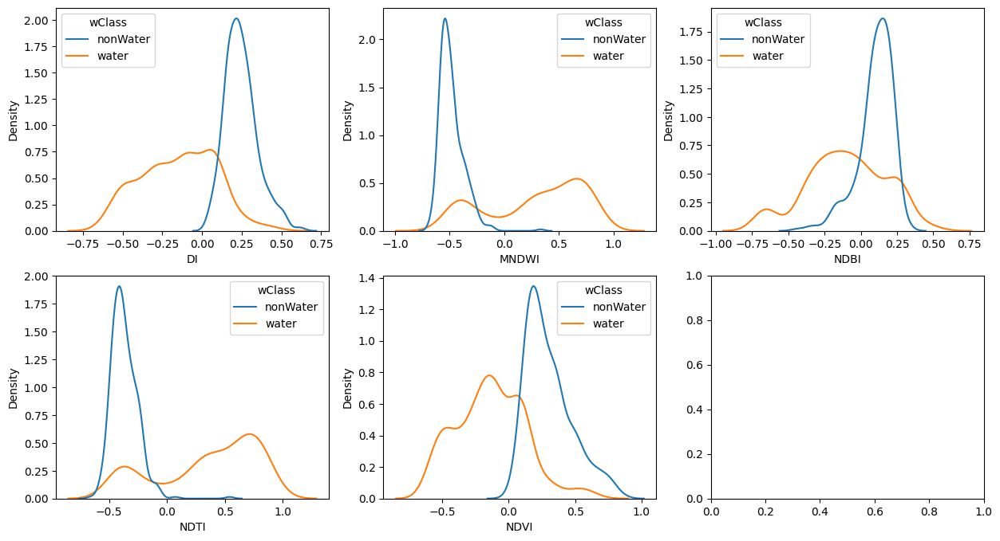

In [68]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 8))
axes = axes.flatten()
for i, variable in enumerate(['DI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI']):
    sns.kdeplot(data=df,x=variable,ax=axes[i],hue='wClass',multiple='layer')
plt.show()

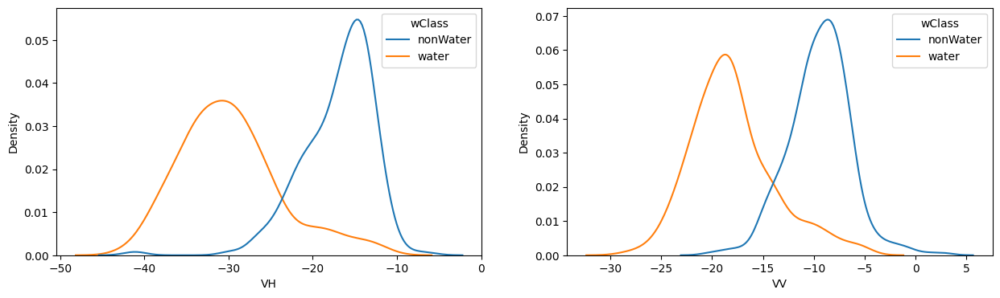

In [69]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
axes = axes.flatten()
for i, variable in enumerate(['VH', 'VV']):
    sns.kdeplot(data=df,x=variable,ax=axes[i],hue='wClass',multiple='layer')
plt.show()

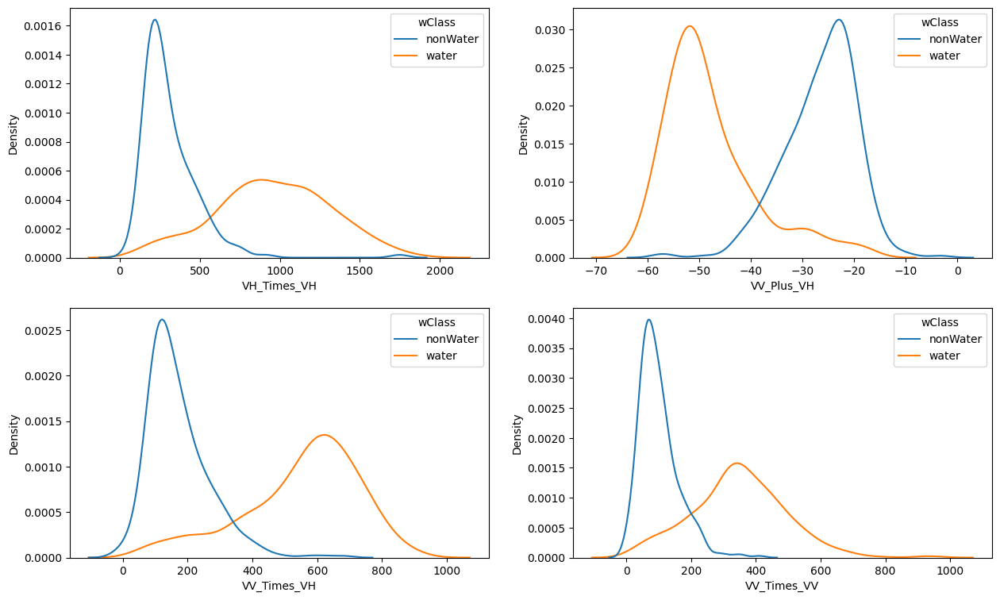

In [70]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 9))
axes = axes.flatten()
for i, variable in enumerate(['VH_Times_VH', 'VV_Plus_VH', 'VV_Times_VH', 'VV_Times_VV']):
    sns.kdeplot(data=df,x=variable,ax=axes[i],hue='wClass',multiple='layer')
plt.show()

<Axes: >

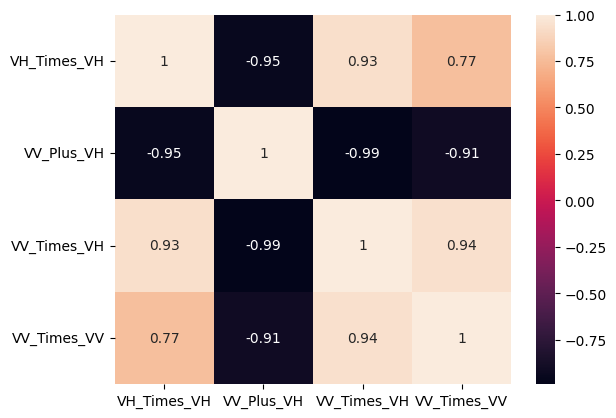

In [71]:
sns.heatmap(df[['VH_Times_VH', 'VV_Plus_VH', 'VV_Times_VH', 'VV_Times_VV']].corr(),annot=True)

<Axes: >

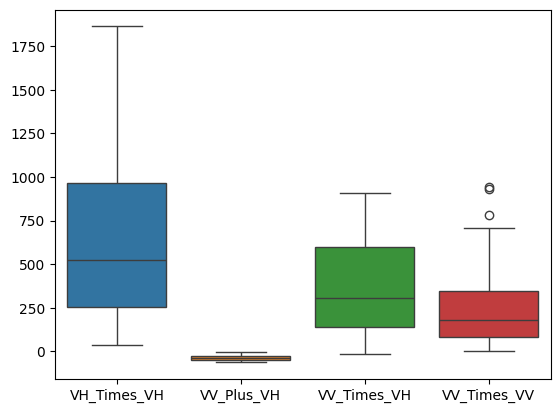

In [77]:
sns.boxplot(df[['VH_Times_VH', 'VV_Plus_VH', 'VV_Times_VH', 'VV_Times_VV']])

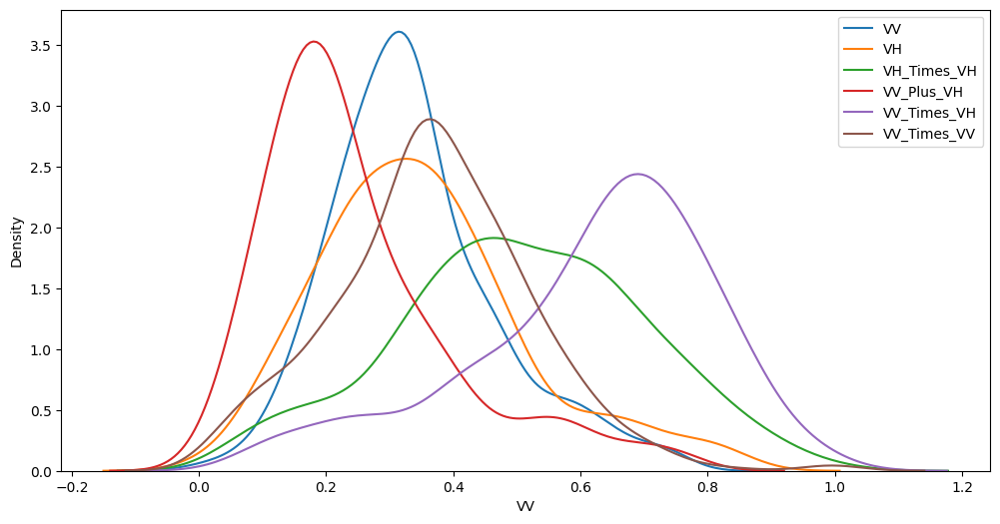

In [72]:
plt.figure(figsize=(12, 6))

for column in ['VV', 'VH', 'VH_Times_VH', 'VV_Plus_VH', 'VV_Times_VH', 'VV_Times_VV']:
    min_val = min(df[column])
    max_val = max(df[column])
    sns.kdeplot(df[df['wClass']=='water'][column].apply(lambda x:
        (x-min_val)/(max_val-min_val)), fill=False, label=column)

plt.legend()
plt.show()

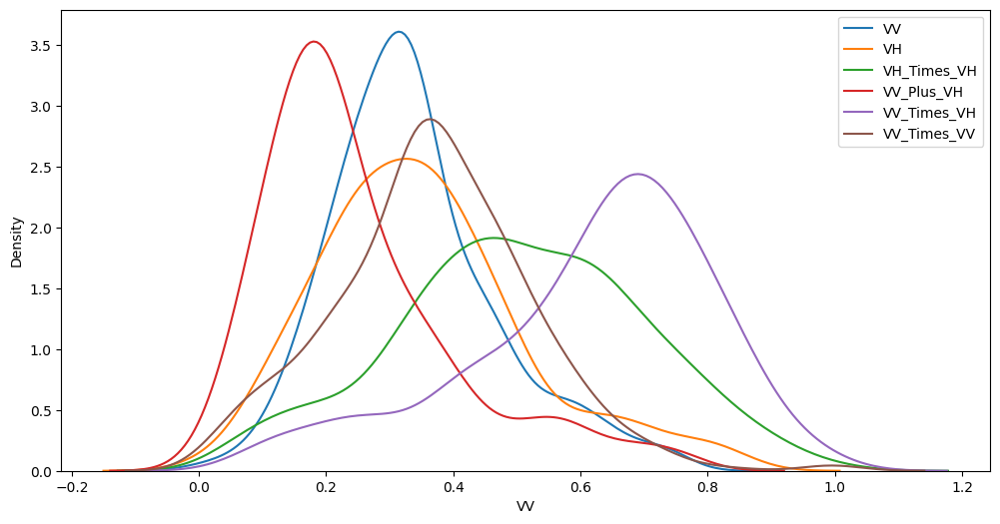

In [73]:
plt.figure(figsize=(12, 6))

for column in ['VV', 'VH', 'VH_Times_VH', 'VV_Plus_VH', 'VV_Times_VH', 'VV_Times_VV']:
    min_val = min(df[column])
    max_val = max(df[column])
    sns.kdeplot(df[df['wClass']=='water'][column].apply(lambda x:
        (x-min_val)/(max_val-min_val)), fill=False, label=column)

plt.legend()
plt.show()

<Axes: >

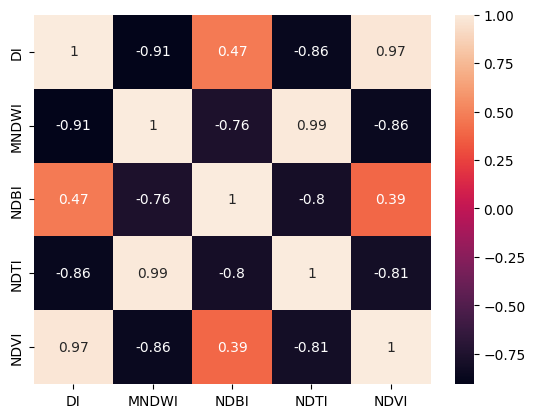

In [74]:
sns.heatmap(df[['DI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI']].corr(),annot=True)

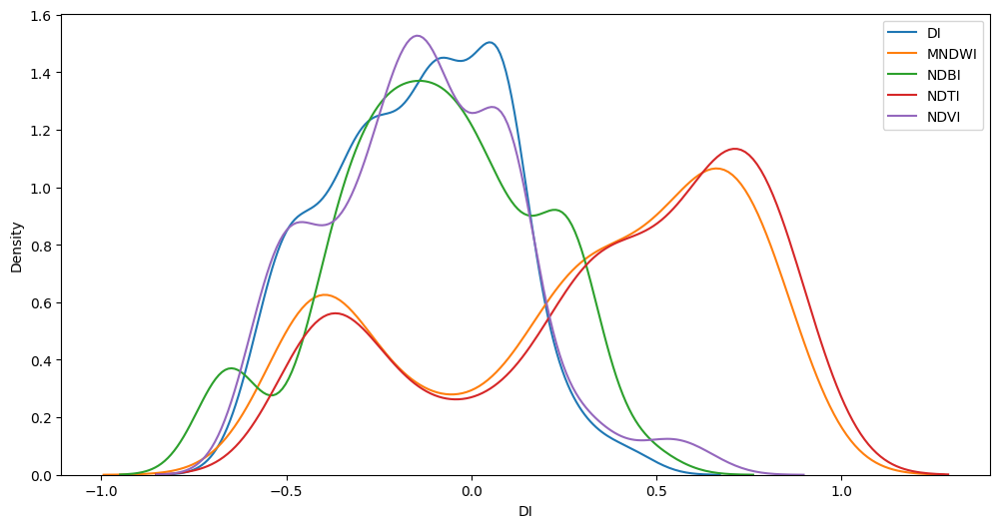

In [75]:
plt.figure(figsize=(12, 6))

for column in ['DI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI']:
    sns.kdeplot(df[df['wClass']=='water'][column], fill=False, label=column)

plt.legend()
plt.show()

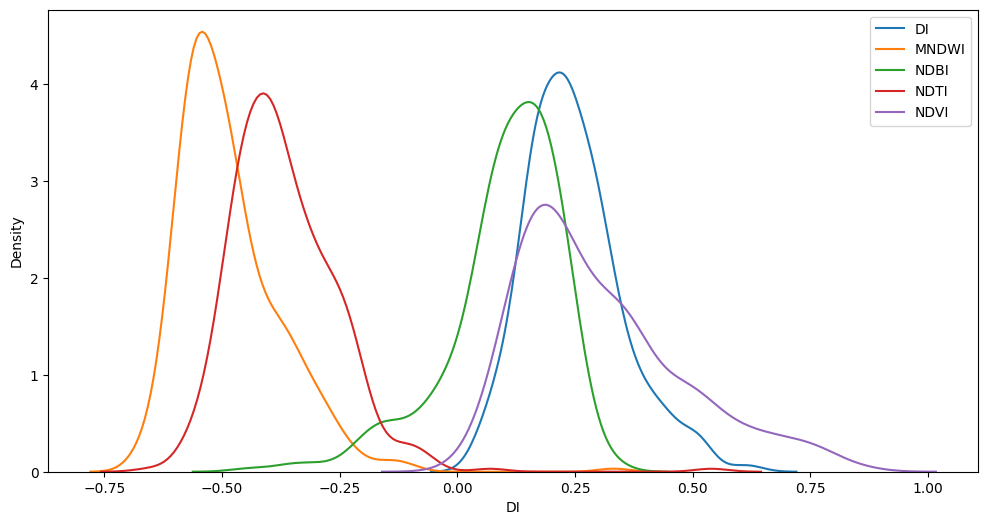

In [76]:
plt.figure(figsize=(12, 6))

for column in ['DI', 'MNDWI', 'NDBI', 'NDTI', 'NDVI']:
    sns.kdeplot(df[df['wClass']=='nonWater'][column], fill=False, label=column)

plt.legend()
plt.show()